- Preparation for the <b>True.csv</b> and <b>Fake.csv</b> files in the `../data` folder
    - <b>Notebook was worked on Windows OS</b>
    - Cells provide a few directions and approaches that can help readers to understand how it works
    - Kaggle data sources: <https://www.kaggle.com/clmentbisaillon/fake-and-real-news-dataset>
    - Summary is on the end of the notebook

# Import python libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px #interactive visualizations
import seaborn as sns

import string
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer 
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize

import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Import tf and keras - as embedded in tensorflow!
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Dropout, Bidirectional
from tensorflow.keras.models import Model


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Kun\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Kun\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Kun\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Load the data

In [2]:
# Read True data and Fake data from local
df_true = pd.read_csv(r"..\data\True.csv")
df_fake = pd.read_csv(r"..\data\Fake.csv")

# Data preparation and exploration

- Show how many `samples` for each class i.e. True and Fake
- Show how many `NULL` elements are presented and property of dataset
- Add attributes for two dataframes 

In [3]:
# Show top 5 rows in df_true
df_true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [4]:
# Show top 5 rows in df_fake
df_fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [5]:
print(df_true.shape)
print("-"*20)
print(df_fake.shape)

(21417, 4)
--------------------
(23481, 4)


In [6]:
print(df_true.dtypes)
print("-"*20)
print(df_fake.dtypes)

title      object
text       object
subject    object
date       object
dtype: object
--------------------
title      object
text       object
subject    object
date       object
dtype: object


In [7]:
# Check if there is any missing data in True dataframe
print(df_true.isnull().sum())

print("-"*20)

# Check if there is any missing data in Fake dataframe
print(df_fake.isnull().sum())

title      0
text       0
subject    0
date       0
dtype: int64
--------------------
title      0
text       0
subject    0
date       0
dtype: int64


In [8]:
# Show a list of articles considered as real news
df_true.describe()

,title,text,subject,date
count,21417,21417,21417,21417
unique,20826,21192,2,716
top,Factbox: Trump fills top jobs for his administ...,(Reuters) - Highlights for U.S. President Dona...,politicsNews,"December 20, 2017"
freq,14,8,11272,182


In [9]:
# Show a list of articles considered as fake news
df_fake.describe()

,title,text,subject,date
count,23481,23481,23481,23481
unique,17903,17455,6,1681
top,MEDIA IGNORES Time That Bill Clinton FIRED His...,,News,"May 10, 2017"
freq,6,626,9050,46


In [10]:
# Add a attribute column "class" to indicate whether the news is real(1) or fake(0)
df_true['target'] = 1
df_fake['target'] = 0

In [11]:
# After adding "class" column in df_true
df_true.head()

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [12]:
# After adding "class" column in df_fake
df_fake.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",0
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",0
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",0
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",0
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",0


# Data concatenation

- To concatenate two dataframes which are `df_true` and `df_fake`

In [13]:
# Concatenate df_true and df_fake into df_dataset
df_dataset = pd.concat([df_true, df_fake]).reset_index(drop=True)
df_dataset

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",0
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",0


In [14]:
#Combining the title and text columns
df_dataset['text'] = df_dataset['title'] + " " + df_dataset['text']

#Deleting few columns from the data 
del df_dataset['title']
del df_dataset['subject']
del df_dataset['date']

In [15]:
df_dataset.head()

,text,target
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1


In [16]:
# Review content of text in first row
df_dataset['text'][0]

'As U.S. budget fight looms, Republicans flip their fiscal script WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non

# Data cleaning

- Removing the stopwords using `nltk` https://github.com/nltk/nltk
- Stopwords are the words that has useless effect on the text, <b>i.e., or, on, and, the, etc.</b>
- I refer to the method of filtering stopwords (Source code is adapted from `In[11]`: https://www.kaggle.com/namithadeshpande027/fake-and-real-news)

In [17]:
#Choosing the language as english
stop = set(stopwords.words('english'))

#Removing the stopwords from text
def remove_stopwords(text):
    final_text = []
    text = text.lower()
    for i in text.split():
        if i.strip() not in stop:
            final_text.append(i.strip())
    return " ".join(final_text)

#Removing the noisy text
def clean_text(text):
    text = remove_stopwords(text)
    return text

df_dataset['text'] = df_dataset['text'].apply(clean_text)

In [18]:
print(df_dataset['text'][0])

u.s. budget fight looms, republicans flip fiscal script washington (reuters) - head conservative republican faction u.s. congress, voted month huge expansion national debt pay tax cuts, called “fiscal conservative” sunday urged budget restraint 2018. keeping sharp pivot way among republicans, u.s. representative mark meadows, speaking cbs’ “face nation,” drew hard line federal spending, lawmakers bracing battle january. return holidays wednesday, lawmakers begin trying pass federal budget fight likely linked issues, immigration policy, even november congressional election campaigns approach republicans seek keep control congress. president donald trump republicans want big budget increase military spending, democrats also want proportional increases non-defense “discretionary” spending programs support education, scientific research, infrastructure, public health environmental protection. “the (trump) administration already willing say: ‘we’re going increase non-defense discretionary s

- Using `gensim` https://github.com/RaRe-Technologies/gensim
- <b>Punctuation</b> should be removed
- This lowercases and tokenizes the text, it convert a document into a list of lowercases tokens.

In [19]:
# Removing words under 2 or less characters from text!
def text_preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if len(token) > 3:
            result.append(token)       
    return result

df_dataset['clean'] = df_dataset['text'].apply(text_preprocess)

In [20]:
# Show cleaned up news after removing stopwords
print(df_dataset['clean'][0])

['budget', 'fight', 'looms', 'republicans', 'flip', 'fiscal', 'script', 'washington', 'reuters', 'head', 'conservative', 'republican', 'faction', 'congress', 'voted', 'month', 'huge', 'expansion', 'national', 'debt', 'cuts', 'called', 'fiscal', 'conservative', 'sunday', 'urged', 'budget', 'restraint', 'keeping', 'sharp', 'pivot', 'among', 'republicans', 'representative', 'mark', 'meadows', 'speaking', 'face', 'nation', 'drew', 'hard', 'line', 'federal', 'spending', 'lawmakers', 'bracing', 'battle', 'january', 'return', 'holidays', 'wednesday', 'lawmakers', 'begin', 'trying', 'pass', 'federal', 'budget', 'fight', 'likely', 'linked', 'issues', 'immigration', 'policy', 'even', 'november', 'congressional', 'election', 'campaigns', 'approach', 'republicans', 'seek', 'keep', 'control', 'congress', 'president', 'donald', 'trump', 'republicans', 'want', 'budget', 'increase', 'military', 'spending', 'democrats', 'also', 'want', 'proportional', 'increases', 'defense', 'discretionary', 'spending'

In [21]:
df_dataset.head()

,text,target,clean
0,"u.s. budget fight looms, republicans flip fisc...",1,"[budget, fight, looms, republicans, flip, fisc..."
1,u.s. military accept transgender recruits mond...,1,"[military, accept, transgender, recruits, mond..."
2,senior u.s. republican senator: 'let mr. muell...,1,"[senior, republican, senator, mueller, washing..."
3,fbi russia probe helped australian diplomat ti...,1,"[russia, probe, helped, australian, diplomat, ..."
4,trump wants postal service charge 'much more' ...,1,"[trump, wants, postal, service, charge, much, ..."


In [22]:
# Collect total vocabulary
lst_words = []
for i in df_dataset['clean']:
    for j in i:
        lst_words.append(j)
        
# From first row to the last row, all words are stored into lst_words  
len(lst_words)

10122661

<b>The number is a condition for tokenized words IN Data Split</b>

In [23]:
# Derive the number of "UNIQUE" words using set()
uni_words = len(list(set(lst_words)))
print(f"The maximum number of words in a dictionary is: {uni_words}")

The maximum number of words in a dictionary is: 108966


In [24]:
# Joined elements of df_dataset['clean'] into a new column (for training Machine Learning models)
df_dataset['clean_joined'] = df_dataset['clean'].apply(lambda x: " ".join(x))

In [25]:
df_dataset.head()

,text,target,clean,clean_joined
0,"u.s. budget fight looms, republicans flip fisc...",1,"[budget, fight, looms, republicans, flip, fisc...",budget fight looms republicans flip fiscal scr...
1,u.s. military accept transgender recruits mond...,1,"[military, accept, transgender, recruits, mond...",military accept transgender recruits monday pe...
2,senior u.s. republican senator: 'let mr. muell...,1,"[senior, republican, senator, mueller, washing...",senior republican senator mueller washington r...
3,fbi russia probe helped australian diplomat ti...,1,"[russia, probe, helped, australian, diplomat, ...",russia probe helped australian diplomat washin...
4,trump wants postal service charge 'much more' ...,1,"[trump, wants, postal, service, charge, much, ...",trump wants postal service charge much more am...


In [26]:
df_dataset['clean_joined'][0]

'budget fight looms republicans flip fiscal script washington reuters head conservative republican faction congress voted month huge expansion national debt cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot among republicans representative mark meadows speaking face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy even november congressional election campaigns approach republicans seek keep control congress president donald trump republicans want budget increase military spending democrats also want proportional increases defense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration already willing going increase defense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats 

# Data visualization

- Checking the variable for each class
- Word cloud (Source code is adapted from `In[13]`, `In[14]` https://github.com/RamyaVidiyala/Fake-news-classifier)

Text(0.5, 1.0, 'target variable count')

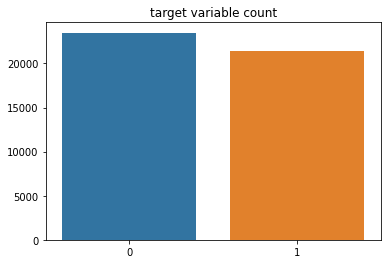

In [27]:
#Checking for imbalance in the dataset
count = df_dataset['target'].value_counts().values
sns.barplot(x = [0, 1], y = count)
plt.title('target variable count')

<b>Note: There are fake news more than real news, the number of each class is similar</b>

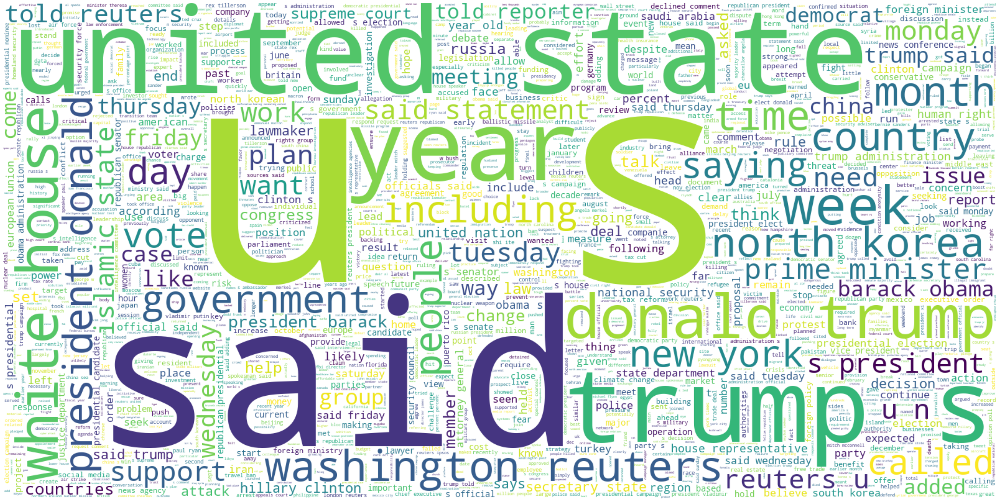

In [28]:
#Word cloud for real news
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(df_dataset[df_dataset['target'] == 1].text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

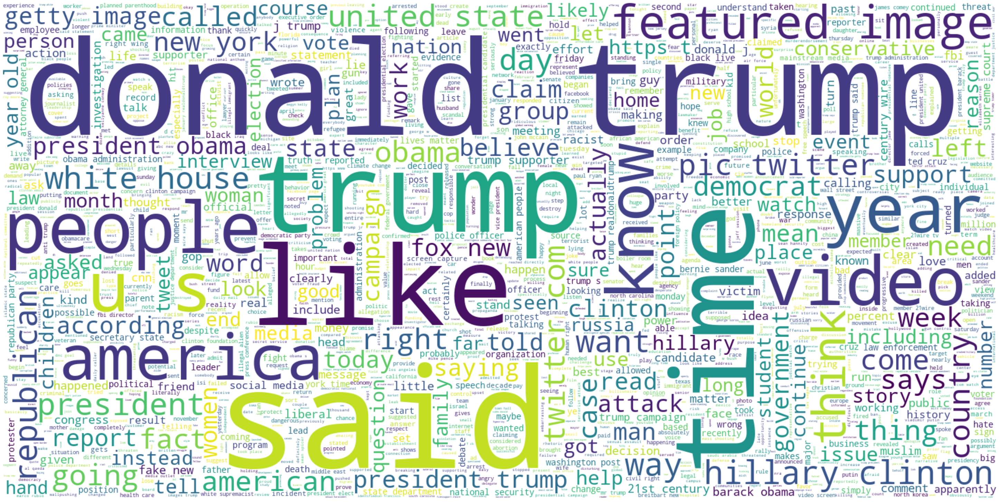

In [29]:
#Word cloud for fake news
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(df_dataset[df_dataset['target'] == 0].text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

# Modeling

- Using Pipleline with <b>TF-IDF</b> (Referance: https://kavita-ganesan.com/tfidftransformer-tfidfvectorizer-usage-differences/#.Yhgei-hKh1c) and <b>machine learning models</b> 

- Showcases following down below (source code and referance are adapted from links):
    - Random forest
        - https://github.com/SushwanthReddy/Fake-News-Detection-using-Machine-Learning
        - https://github.com/RamyaVidiyala/Fake-news-classifier
    - Logistic Regression <b>(baseline)</b>
        - https://github.com/martentyrk/FakeNewsDetection
    - LSTM 
        - https://www.kaggle.com/parvezsohail/classification-of-fake-news-with-lstm
        - https://leemeng.tw/shortest-path-to-the-nlp-world-a-gentle-guide-of-natural-language-processing-and-deep-learning-for-everyone.html

## Methods for demonstrate the different performance with models

- Model report includes <b>accuracy and f1-score<b>
- Visualize <b>confusion matrix</b>

In [30]:
# This function will print the metrcis for diffeent model
def print_model_report(y_test, prediction, ML_modelName):
    print("Model report for: "+ ML_modelName + "\n")
    
    print(classification_report(y_test, prediction, digits=4))

# Show confusion matrix plot
def plot_confusion_matrix(y_test, prediction, ML_modelName, cmap):
    cm = confusion_matrix(y_test, prediction)
    
    ax = sns.heatmap(cm, 
                     annot=True, 
                     annot_kws={'size':18,'weight':'normal'},
                     fmt='.20g', 
                     cmap=cmap, 
                     cbar_kws={'shrink':1},
                     linewidths=2)
    
    plt.title("Confusion Matrix for: " + ML_modelName)
    plt.ylabel("Actual Label")
    plt.xlabel("Predict Label")
    cbar = ax.collections[0].colorbar
    plt.show()

# Show ROC curve plot
def plot_ROC(pred_models):    
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    for i in pred_models.index:
        plt.plot(pred_models.loc[i]['fpr'], 
                 pred_models.loc[i]['tpr'], 
                 label=pred_models.loc[i]['classifiers'] +", AUC={:.3f}".format(pred_models.loc[i]['auc']))


    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()
    
# Show ROC curve plot
def plot_ROC_zoom(pred_models):
    # Zoom in view of the upper left corner.
    plt.figure(1)
    plt.xlim(0, 0.2)
    plt.ylim(0.8, 1)
    plt.plot([0, 1], [0, 1], 'k--')
    for i in pred_models.index:
        plt.plot(pred_models.loc[i]['fpr'], 
                 pred_models.loc[i]['tpr'], 
                 label=pred_models.loc[i]['classifiers'] +", AUC={:.3f}".format(pred_models.loc[i]['auc']))
                 
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve (zoomed in at top left)')
    plt.legend(loc='best')
    plt.show()

## Words to be tokens and words embeddings


>From Wikipedia definition, Natural Language Processing (NLP) is a subfield of computer science and artificial intelligence that focuses on how to get computers to process and analyze large amounts of (human) natural language data. 

Referance: https://en.wikipedia.org/wiki/Neuro-linguistic_programming

Deep learning models cannot understand human languages so that we will try to be <b>numerically represented</b> 





In [31]:
# Derive maximum length of token, then it will be used in word embeddings. 
max_len = -1
for idx in df_dataset['clean']:
    if (len(idx)>max_len):
        max_len = len(idx) 
print(f"The maximum number of words in text is = {max_len}")

The maximum number of words in text is = 4701


In [32]:
fig = px.histogram(x = [len(i) for i in df_dataset['clean']], nbins = 150)
fig.show()

<b>Note: Most length of words are between 50 and 250</b>

## Data Split

- Split Traning data and testing data for <b>machining learning models and LSTM</b>
- Set cross validation

In [33]:
# Identify the independent and dependent variables!
X = df_dataset['clean_joined']
y = df_dataset['target']

In [34]:
# Train and Test data splits!

# With pipelineLR approach!
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [35]:
#Create sequences of tokenized words
MAX_NUM_WORDS = max_len #4701
tokenizer = Tokenizer(num_words = MAX_NUM_WORDS)

tokenizer.fit_on_texts(X_train)

# Transform each token in texts to a sequence of integers!
train_sequences = tokenizer.texts_to_sequences(X_train)
test_sequences = tokenizer.texts_to_sequences(X_test)

In [36]:
print(f"Sequence training dataset length: {len(train_sequences)}")
print(f"Sequence testing dataset length: {len(test_sequences)}")

Sequence training dataset length: 35918
Sequence testing dataset length: 8980


In [37]:
#The index number corresponds to the original words in dictionary
for seq in train_sequences[:1]:
    print([tokenizer.index_word[idx] for idx in seq])

['socgen', 'says', 'wrongdoing', 'handling', 'national', 'front', 'accounts', 'paris', 'reuters', 'french', 'bank', 'societe', 'generale', 'wednesday', 'rejected', 'right', 'national', 'front', 'accusations', 'acted', 'suffocate', 'party', 'closing', 'accounts', 'societe', 'generale', 'group', 'decisions', 'whether', 'open', 'close', 'bank', 'account', 'depend', 'purely', 'banking', 'reasons', 'respect', 'regulatory', 'requirements', 'without', 'taking', 'account', 'political', 'consideration', 'said', 'statement', 'regarding', 'opening', 'account', 'credit', 'nord', 'financial', 'representative', 'front', 'national', 'asked', 'bank', 'france', 'right', 'bank', 'account', 'individual', 'credit', 'nord', 'responded', 'bank', 'france', 'requirements', 'offered', 'services', 'required', 'within', 'right', 'regulatory', 'framework', 'credit', 'nord', 'part', 'french', 'retail', 'banking', 'network', 'socgen']


In [38]:
# Understand sequence lengths in each text are not same 
for seq in train_sequences[:10]:
    print(len(seq), seq[:5], ' ...')

84 [49766, 62, 2647, 2265, 43]  ...
241 [66, 759, 250, 18100, 23]  ...
163 [1, 11255, 127, 62, 60]  ...
312 [117, 6039, 1, 1465, 211]  ...
618 [1789, 3382, 1008, 64, 1155]  ...
219 [1389, 6587, 4592, 7999, 889]  ...
293 [1, 12103, 422, 155, 12223]  ...
491 [4570, 368, 424, 467, 119]  ...
247 [461, 2917, 4366, 2982, 20]  ...
28 [4132, 19314, 4408, 896, 7216]  ...


In [39]:
# Zero padding for different sequence have the same length (fillted 0 for missing)
MAX_SEQUENCE_LENGTH = 60

# pad_sequences is used to ensure that all sequences in a list have the same length!
padded_train = pad_sequences(train_sequences, maxlen = MAX_SEQUENCE_LENGTH)
padded_test = pad_sequences(test_sequences, maxlen = MAX_SEQUENCE_LENGTH)

In [40]:
for i,doc in enumerate(padded_train[5:10]):
     print(f"The padded encoding for document {5+1} is : {doc}")

The padded encoding for document 6 is : [    4  1285  4476   433 49770  5559  4476  3924  2511  1028  6345   267
  3398  7438 43388 17716   831    89  4476   288   208    88  2366 13098
   319    42  8093   145   216   672   898    32 14301  3463  4069 10235
  8144  8405  4365 11256  5714   746  8561  2366     2  1391   757 10420
  1511  4541  3250    53   489   160  2750   815  8952   193  4000  5746]
The padded encoding for document 6 is : [   80  4249  2045  9005     2   629 11064  2700  1453  8952   159     1
    53    28   104  8952   140   334   725  1585   570  5059 11064  2700
  9005     2   308   586   104 10509    29     9  3876    61    58   606
    23    16   586   313    52  1318     9  5654  5147    32    55  1583
   586  1107  1994  2132  7825     2  8632    56     4  1188   313   160]
The padded encoding for document 6 is : [ 254  850 1675  289   72   79 1225   39 3947  338 5593  632  368  159
   21  149 3391  610 4941 3610 1771 2522 2729 3966  341  368  143   19
   14 

In [41]:
#StratifiedKFold is a variation of KFold!
SKF = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)

## Random Forest Model Creation

In [42]:
# Fitting the Logistic Regression to the Training set!
pipeline_RF = Pipeline([('vect', CountVectorizer()),
                        ('tfidf', TfidfTransformer(norm='l2')),
                        ('model', RandomForestClassifier(n_jobs = -1, random_state = 42))])

### Random Forest Model Training

In [43]:
# Fitting the Random Forest to the Training set!

# With Pipeline option!
model_RF = pipeline_RF.fit(X_train, y_train)

In [44]:
# Perform the training using KFolds cross validation method!
scores = cross_val_score(model_RF, X_train, y_train, scoring='accuracy', cv=SKF, n_jobs=-1)
print(f" Accuracy of Random Forest  : {round (np.mean(scores), 4)*100} %")

 Accuracy of Random Forest  : 99.06 %


### Predictions using Random Forest

In [45]:
# y_pred With Pipeline
pred_RF = model_RF.predict(X_test)

In [46]:
# Print model report for LogisticRegression
print_model_report(y_test, pred_RF, "Random Forest")

Model report for: Random Forest

              precision    recall  f1-score   support

           0     0.9906    0.9900    0.9903      4696
           1     0.9890    0.9897    0.9894      4284

    accuracy                         0.9899      8980
   macro avg     0.9898    0.9899    0.9898      8980
weighted avg     0.9899    0.9899    0.9899      8980



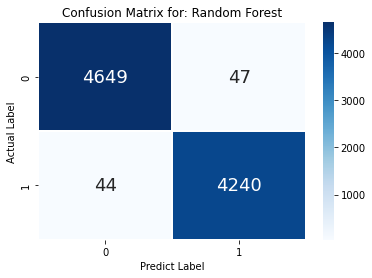

In [47]:
# Visualize the Confusion Matrix for LogisticRegression!
plot_confusion_matrix(y_test, pred_RF, "Random Forest", plt.cm.Blues)

## Logistic Regression Model Creation

In [48]:
pipeline_LR = Pipeline([('vect', CountVectorizer()), # Convert a collection of text documents to a matrix of token counts
                        ('tfidf', TfidfTransformer(norm='l2')),
                        ('model', LogisticRegression())])

### Logistic Regression Model Training

In [49]:
# Fitting the Logistic Regression to the Training set!

# With Pipeline option!
model_LR = pipeline_LR.fit(X_train, y_train)

In [50]:
# Perform the training using KFolds cross validation method!

scores = cross_val_score(model_LR, X_train, y_train, scoring='accuracy', cv=SKF, n_jobs=-1)
print(f" Accuracy of Logistic Regression : {round(np.mean(scores) ,4) * 100} %")

 Accuracy of Logistic Regression : 98.49 %


### Predictions using Logistic Regression

In [51]:
# y_pred With Pipeline
pred_LR = model_LR.predict(X_test) 

In [52]:
# Print model report for LogisticRegression
print_model_report(y_test, pred_LR, "Logistic Regression")

Model report for: Logistic Regression

              precision    recall  f1-score   support

           0     0.9891    0.9817    0.9854      4696
           1     0.9801    0.9881    0.9841      4284

    accuracy                         0.9847      8980
   macro avg     0.9846    0.9849    0.9847      8980
weighted avg     0.9848    0.9847    0.9847      8980



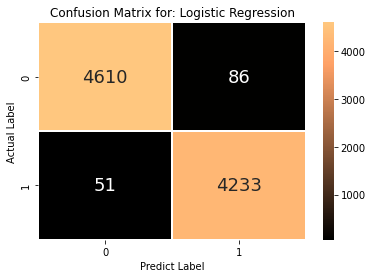

In [53]:
# Visualize the Confusion Matrix for LogisticRegression!
plot_confusion_matrix(y_test, pred_LR, "Logistic Regression", 'copper')

## LSTM Creation

In [54]:
# The number of word in sequence
#MAX_NUM_WORDS = uni_words

# Maximum limit of length with token each sequence 
#MAX_SEQUENCE_LENGTH = 60

# Embedding word dimension 
NUM_EMBEDDING_DIM = 256

# LSTM output vector dimension 
NUM_LSTM_UNITS = 256

In [55]:
first_input = Input(shape=(MAX_SEQUENCE_LENGTH, ), dtype='int32')

embedding_layer = Embedding(MAX_NUM_WORDS, NUM_EMBEDDING_DIM)
first_embedded = embedding_layer(first_input)

shared_lstm = LSTM(NUM_LSTM_UNITS)
first_output = shared_lstm(first_embedded)

# Dense layer for activation with sigmoid because it is a binary classification
dense =  Dense(units=1, activation='sigmoid')
predictions = dense(first_output)

model_LSTM = Model(inputs=first_input, outputs=predictions)

If the note cannot be worked `plot_model`, there has a couple of procedures to deal with problem:
1. Open Anaconda prompt for the desired environment
    - `pip install pydot`
    - `pip install graphviz`
2. Download and install the latest version exe of Graphviz:
    - https://gitlab.com/graphviz/graphviz/-/releases
3. Set and check PC enviroment path
4. Run `from tensorflow.keras.utils import plot_model`

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 60)]              0         
                                                                 
 embedding (Embedding)       (None, 60, 256)           27895296  
                                                                 
 lstm (LSTM)                 (None, 256)               525312    
                                                                 
 dense (Dense)               (None, 1)                 257       
                                                                 
Total params: 28,420,865
Trainable params: 28,420,865
Non-trainable params: 0
_________________________________________________________________


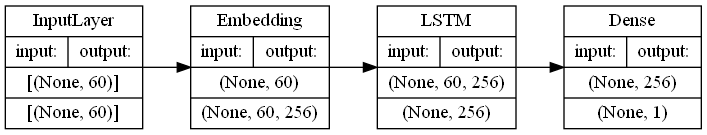

In [56]:
model_LSTM.summary()
plot_model(model_LSTM, to_file='model.png', show_shapes=True, show_layer_names=False, rankdir='LR')

In [57]:
# model_LSTM.compile: it defines the loss function, the optimizer and the metrics
model_LSTM.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

In [58]:
type(y_train)

pandas.core.series.Series

### LSTM Model Training

In [59]:
# Convert y_train input to an array!
y_train_arr = np.asarray(y_train)
y_test_arr = np.asarray(y_test)

BATCH_SIZE = 256

# The number of execution for total training set
NUM_EPOCHS = 10

# Model training implementation
history = model_LSTM.fit(x=padded_train, 
                         y=y_train_arr,
                         batch_size=BATCH_SIZE,
                         epochs=NUM_EPOCHS,
                         validation_data=(padded_test, y_test_arr), # derive loss and accuracy with validation data after each epoch
                         shuffle=True)


Epoch 1/10
141/141 [==============================] - 97s 675ms/step - loss: 0.1953 - accuracy: 0.9333 - val_loss: 0.0980 - val_accuracy: 0.9674
Epoch 2/10
141/141 [==============================] - 89s 630ms/step - loss: 0.0566 - accuracy: 0.9823 - val_loss: 0.0935 - val_accuracy: 0.9725
Epoch 3/10
141/141 [==============================] - 88s 628ms/step - loss: 0.0289 - accuracy: 0.9913 - val_loss: 0.0715 - val_accuracy: 0.9774
Epoch 4/10
141/141 [==============================] - 89s 633ms/step - loss: 0.0141 - accuracy: 0.9957 - val_loss: 0.1058 - val_accuracy: 0.9614
Epoch 5/10
141/141 [==============================] - 89s 631ms/step - loss: 0.0080 - accuracy: 0.9978 - val_loss: 0.0777 - val_accuracy: 0.9796
Epoch 6/10
141/141 [==============================] - 90s 640ms/step - loss: 0.0042 - accuracy: 0.9990 - val_loss: 0.1041 - val_accuracy: 0.9758
Epoch 7/10
141/141 [==============================] - 90s 641ms/step - loss: 0.0023 - accuracy: 0.9994 - val_loss: 0.1000 - val_ac

### Predictions using LSTM

In [60]:
padded_test.shape

(8980, 60)

In [61]:
pred_LSTM = model_LSTM.predict(padded_test)
pred_LSTM.shape

(8980, 1)

In [62]:
# if the predicted value is > 0.5, then it is real news else it is fake news!

predictions = []

for i in range(len(pred_LSTM)):
    if pred_LSTM[i].item() > 0.5:
        predictions.append(1)
    else:
        predictions.append(0)

### LSTM Model Evaluation

In [63]:
# Print model report for LSTM
print_model_report(y_test, predictions, "LSTM")

Model report for: LSTM

              precision    recall  f1-score   support

           0     0.9807    0.9740    0.9774      4696
           1     0.9717    0.9790    0.9753      4284

    accuracy                         0.9764      8980
   macro avg     0.9762    0.9765    0.9763      8980
weighted avg     0.9764    0.9764    0.9764      8980



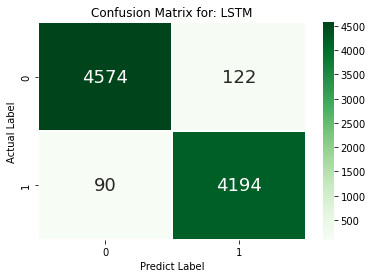

In [64]:
# Visualize the Confusion Matrix for LSTM!
plot_confusion_matrix(y_test, predictions, "LSTM", plt.cm.Greens)

# ROC curves evaluation

- <b>ROC curve</b> - https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/
- Source code is adapted from https://hackernoon.com/simple-guide-on-how-to-generate-roc-plot-for-keras-classifier-2ecc6c73115a

In [65]:
df_auc = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])

fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, pred_RF)
auc_rf = auc(fpr_rf, tpr_rf)
df_auc = df_auc.append({'classifiers':"Random Forest",
               'fpr':fpr_rf, 
               'tpr':tpr_rf, 
               'auc':auc_rf}, ignore_index=True) 


fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, pred_LR)
auc_lr = auc(fpr_lr, tpr_lr)
df_auc = df_auc.append({'classifiers': "Logistic Regression(baseline)",
               'fpr':fpr_lr, 
               'tpr':tpr_lr, 
               'auc':auc_lr}, ignore_index=True) 


fpr_LSTM, tpr_LSTM, thresholds_LSTM = roc_curve(y_test_arr, pred_LSTM)
auc_LSTM = auc(fpr_LSTM, tpr_LSTM)
df_auc= df_auc.append({'classifiers': "LSTM",
               'fpr':fpr_LSTM, 
               'tpr':tpr_LSTM, 
               'auc':auc_LSTM}, ignore_index=True) 

df_auc

,classifiers,fpr,tpr,auc
0,Random Forest,"[0.0, 0.010008517887563885, 1.0]","[0.0, 0.9897292250233427, 1.0]",0.989860
1,Logistic Regression(baseline),"[0.0, 0.018313458262350937, 1.0]","[0.0, 0.9880952380952381, 1.0]",0.984891
2,LSTM,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.04435107376283847, 0.0557889822595705,...",0.996446


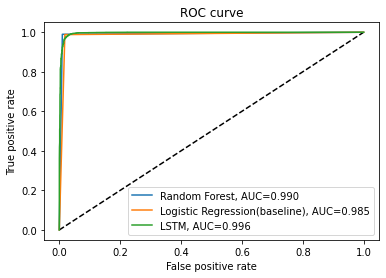

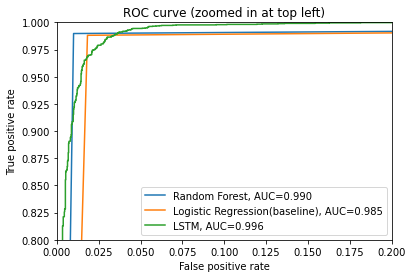

In [66]:
# The first plot is a original view of the graph
plot_ROC(df_auc)
# The second plot is a zoom-in view of the upper left corner of the graph.
plot_ROC_zoom(df_auc)

# Summary

By comparing models performance with Random Forest(RF), Logistic Regression(LR), and Regression, Long-Short Term Memory(LSTM), I have tried to use ROC Curves [1] to demonstrate how good model these are.

- In this case, I choose Random Forest rather than decision tree since Random Forest models have resulted in significant improvements in prediction accuracy as compared to a single tree by growing ’N’ number of trees; each tree in the training set is sampled randomly without replacement [2]. Besides, it was one of non-linear classifiers that apply fake news detection [3]. 


- Logistic Regression is one of generalized linear models [4] which can compare to Random Forest(non-linear classifier). It was also applied fake news detection [5]. Meanwhile, I would like to understand how performance they are between Logistic Regression and Random Forest. Therefore, I regard Logistic Regression as the baseline model.


- LSTM is a specific recurrent neural network (RNN) architecture and it has the potential to outperform standard RNNs for textual data of different lengths [7]. For LSTM, it has been frequently used for solving Natural language processing (NLP) problems. As a result, I would like to use deep learning model to compare to maching learning models. 


- The reason why I consider the value of AUC rather than accuracy or f1-score is that the it visualizes the quality of the ranker or probabilistic model on a testing set, without committing to a classification threshold [8][9].


You can discover this work regarding binary classifier, ROC and AUC values in machine learning classifiers(Random Forest and Logistic Regression) are slightly different, but Logistic Regression is still better than Random Forest. In addition, LSTM performance(0.997) is given by AUC metric, it outperforms other classifiers obviously.


# Referances

[1].https://scholar.smu.edu/datasciencereview/vol1/iss3/9/ </br>
[2].https://link.springer.com/article/10.1023/a:1010933404324 </br>
[3].https://www.anjs.edu.iq/index.php/anjs/article/view/2306 </br>
[4].https://online.stat.psu.edu/stat504/lesson/beyond-logistic-regression-generalized-linear-models-glm </br>
[5].https://www.ijeat.org/wp-content/uploads/papers/v9i1/A2633109119.pdf </br>
[6].https://www.sciencedirect.com/science/article/pii/S1877050920300806 </br>
[7].https://ieeexplore.ieee.org/document/8701258 </br>
[8].https://en.wikipedia.org/wiki/Receiver_operating_characteristic </br>
[9].https://link.springer.com/chapter/10.1007/3-540-44886-1_25

